# 机器学习（进阶）纳米学位毕业项目



## 语音性别识别


---

## 1、问题定义及其衡量标准


**定义**：该语音性别识别项目的基本任务是准确判断一段音频信号属于男性还是女性。


> 这是一个二分类问题，是监督学习（supervised learning）的问题，因此监督学习模型的训练是必不可少的。


**衡量标准**：我们的主要评估指标是准确性（Accuracy），与Kaggle上的相同，其计算公式如下所示：


$$
\begin{align}
Accuracy &= \frac{\#True\ Positive + \#True\ Negative}{\#True\ Positive + \#True\ Negative + \#False\ Positive + \#False\ Negative}\\
& = \frac{\#Rightly\ Predictions}{\#All\ Samples}.
\end{align}
$$


> 当然我们也有诸如Recall，Precision，F1 measure这样的参数，这些会在单个模型的训练中给出，用于更客观地判断模型表现。

---

## 2、问题分析（数据可视化和数据挖掘）


这一部分是**数据预处理**的思考和实现过程。


---

### 导入数据集并初步观察

In [1]:
# 例行检查Python版本，亟待使用的二分类算法需要2.7版本
from sys import version_info
if version_info.major != 2 and version_info.minor != 7:
    raise Exception('Need Python 2.7!')

In [2]:
# 导入处理数据的库
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 返回当前时间的时间戳，该time库用于算法的计算计时
from time import time

# 数据预览需要为DataFrame使用display()
from IPython.display import display

# 导入可视化代码visuals.py，该代码的出处是机器学习纳米学位项目的项目2：为CharityML寻找捐献者。我做了一些微小的改动以适合该毕业项目。
import visuals as vs

# 为该notebook提供更漂亮的可视化效果
%matplotlib inline
# 矢量图，但是之后才使用
#%config InlineBackend.figure_format = 'pdf'

In [3]:
# 先用pandas的read_csv模块导入语音特征数据，记全部原始数据为voice
voice = pd.read_csv('voice.csv')

# 获取voice的数据条目总数
n = len(voice)
print 'The number or voice data is:', n

# 显示第一条数据以获取对数据的印象
display(voice.head(n = 1))

# 第一条数据也不一定代表全部情况，多看看几条也不错，选择前5个
print voice.head()

The number or voice data is: 3168


,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.0,0.0,male


   meanfreq        sd    median       Q25       Q75       IQR       skew  \
0  0.059781  0.064241  0.032027  0.015071  0.090193  0.075122  12.863462   
1  0.066009  0.067310  0.040229  0.019414  0.092666  0.073252  22.423285   
2  0.077316  0.083829  0.036718  0.008701  0.131908  0.123207  30.757155   
3  0.151228  0.072111  0.158011  0.096582  0.207955  0.111374   1.232831   
4  0.135120  0.079146  0.124656  0.078720  0.206045  0.127325   1.101174   

          kurt    sp.ent       sfm  ...    centroid   meanfun    minfun  \
0   274.402906  0.893369  0.491918  ...    0.059781  0.084279  0.015702   
1   634.613855  0.892193  0.513724  ...    0.066009  0.107937  0.015826   
2  1024.927705  0.846389  0.478905  ...    0.077316  0.098706  0.015656   
3     4.177296  0.963322  0.727232  ...    0.151228  0.088965  0.017798   
4     4.333713  0.971955  0.783568  ...    0.135120  0.106398  0.016931   

     maxfun   meandom    mindom    maxdom   dfrange   modindx  label  
0  0.275862  0.007812

通过上述简单观看可以得到三点结论：


* 第一，我们的预测目标label是字符格式，为了方便处理，我们需要**独热编码**；


* 第二，上述前5组数据的label均为male，这说明数据可能排列并非随机，因此我们可能需要想办法**打乱数据顺序**再进行分割，用Excel软件预览csv文件，发现数据集的前半部分均为male，后半部分则为female，这证实了该想法的正确性；


* 第三，第一条数据的倒数后两个特征dfrange和modindx均为0，这可能是数据缺失所致，我们也许需要先**剔除缺失的数据**，以免对预测器有所影响。不过，我们后面会分析如何排除此处数据缺失的可能性。


我将在后面逐一处理这些步骤。

### 数据集统计分析

这一部分是统计数据，尝试对数据集中的输入空间进行充分的说明。

In [4]:
voice.describe()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000
mean,0.180907,0.057126,0.185621,0.140456,0.224765,0.084309,3.140168,36.568461,0.895127,0.408216,0.165282,0.180907,0.142807,0.036802,0.258842,0.829211,0.052647,5.047277,4.994630,0.173752
std,0.029918,0.016652,0.036360,0.048680,0.023639,0.042783,4.240529,134.928661,0.044980,0.177521,0.077203,0.029918,0.032304,0.019220,0.030077,0.525205,0.063299,3.521157,3.520039,0.119454
min,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,0.000000,0.039363,0.055565,0.009775,0.103093,0.007812,0.004883,0.007812,0.000000,0.000000
25%,0.163662,0.041954,0.169593,0.111087,0.208747,0.042560,1.649569,5.669547,0.861811,0.258041,0.118016,0.163662,0.116998,0.018223,0.253968,0.419828,0.007812,2.070312,2.044922,0.099766
50%,0.184838,0.059155,0.190032,0.140286,0.225684,0.094280,2.197101,8.318463,0.901767,0.396335,0.186599,0.184838,0.140519,0.046110,0.271186,0.765795,0.023438,4.992188,4.945312,0.139357
75%,0.199146,0.067020,0.210618,0.175939,0.243660,0.114175,2.931694,13.648905,0.928713,0.533676,0.221104,0.199146,0.169581,0.047904,0.277457,1.177166,0.070312,7.007812,6.992188,0.209183
max,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,0.280000,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374


从方差和最大值最小值可以看出来，存在明显极值，数据波动范围较大的特征是kurt，skew、maxdom和drange虽然也有小幅波动，但波动范围比kurt都小得多。


| 参数 | 参数解释 |
| :-: | :- |
| kurt | 频谱峰度 |
| skew | 频谱偏度 |
| maxdom | 最大主频 |
| drange | 主频范围 |


不过这些不应该算是极端值，因为根据这些特征的统计意义，这些音频信号即使波动比较大，也都是可以发生的。

另外，在数据集的预览中可知并无缺省值。

### 可视化特征分布

由于这里的数据集含有3168条数据且共有20个特征，且若使用PDF格式绘图，一旦使用pd.plotting.scatter_matrix()函数，我的设备就会卡住，因此在这里我先不使用PDF模块，只导出png格式的图片。

如有需要，可以换一台显卡、内存优良的设备运行代码得到PDF格式图片。

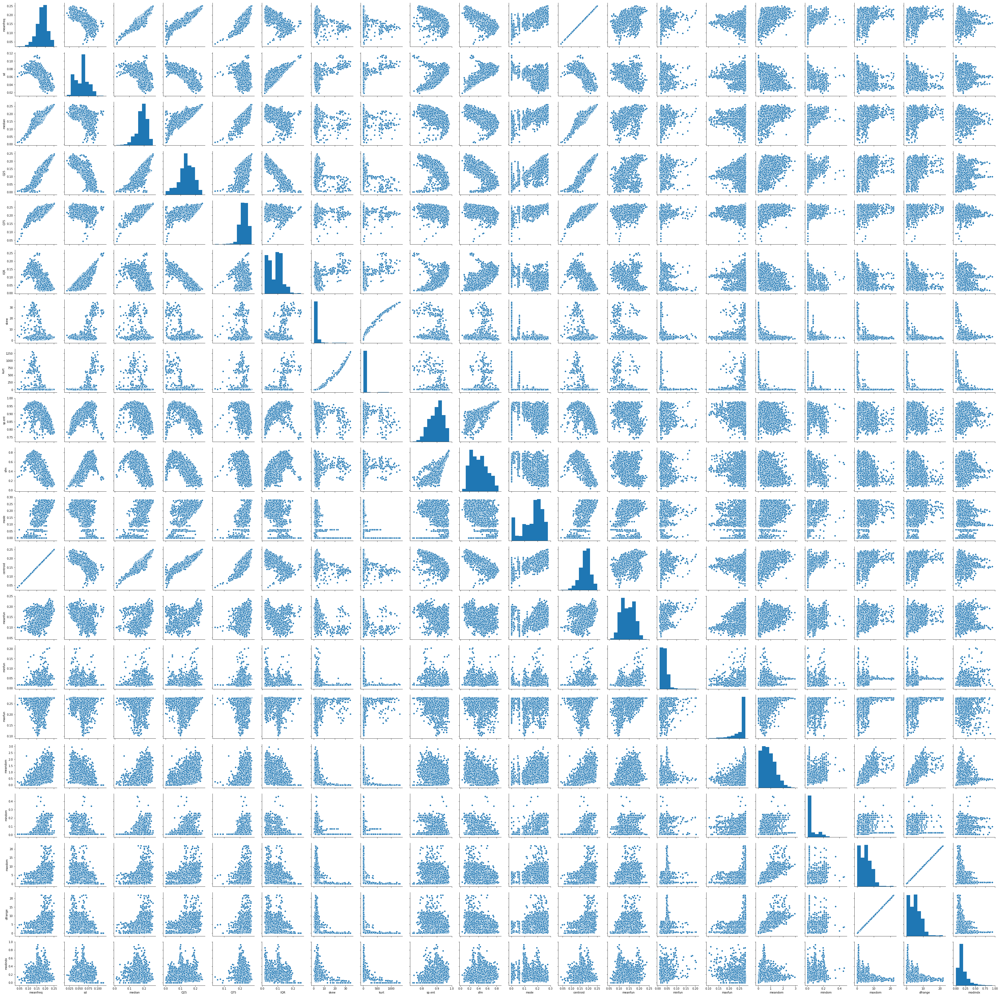

In [5]:
# 对于数据中的每一个特征构造一个散布矩阵
import seaborn as sns
voice_features_names = voice.columns[0:].drop('label')
sns.pairplot(voice, vars = voice_features_names)

双击图片即可放大，其中对角线上的条形图即是特征分布的可视化。


可以看到，有些特征几乎取值集合很小，比如skew和kurt，这样的特征对于分类的效果可能很弱。其它的特征分布较为广泛，各个区间上都有一定的样本数量。

### 对标签进行独热编码

In [6]:
# 将数据分为特征列和对应的标签列，为全部数据保留一个副本
voice_raw = voice
gender_raw = voice['label']
# 方法参见 http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.drop.html
features_raw = voice.drop('label', axis = 1)

# 检查上述分割是否有误
# display(gender_raw.head(n=1))
# display(features_raw.head(n=1))

# 将'gender_raw'编码成数字值，male为1，female为0
gender_onehot = gender_raw.replace(['male', 'female'], [1, 0])

# 为了方便，提取出特征的名字备用
voice_features_names = voice.columns[0:].drop('label')
print "All features' names: ", "\n", voice_features_names

print "Total features'numbers:",len(voice_features_names)

# 打印经过独热编码之后的特征数量
# encoded = list(features_raw.columns)
# print "{} total features after one-hot encoding.".format(len(encoded))

# 检验一下独热编码的效果
# display(gender_onehot.head(n=1))

# 把特征和标签再次合并
voice = features_raw.join(gender_onehot)

# 检验合并效果
# print voice

All features' names:  
Index([u'meanfreq', u'sd', u'median', u'Q25', u'Q75', u'IQR', u'skew', u'kurt',
       u'sp.ent', u'sfm', u'mode', u'centroid', u'meanfun', u'minfun',
       u'maxfun', u'meandom', u'mindom', u'maxdom', u'dfrange', u'modindx'],
      dtype='object')
Total features'numbers: 20


### 是否剔除缺失数据的思考及做法

这是我的一个疑惑，因为简单地用Excel工具查找了数据集中值为0的数据发现，值为0的数据共有366个（指的是366个特征数据），它们既可能是被0填充后的缺失数据，也可能是参数本身就为0。因此，是否处理它们还有待分析。


这些值为0的数据有以下两个分布特征：


* 多出现在mode，dfrange和modindx列；


* 多成片出现，常常有几条排列在一起的数据出现大量0。


不过，根据Kaggle上的参数解释也就释然了：


| 参数 | 参数解释 |
| :-: | :- |
| mode | 频率众数 |
| dfrange | 主频范围 |
| modindx | 累积相邻两帧绝对基频频差除以频率范围 |


频率众数在音频信号大多数时间内没人说话的时候为0；主频范围为0或者绝对基频频差也可能为0。所以从其声学意义看，这些数据为0是比较合理的。


据此，我认为没有必要把它们认定是缺失数据。

### 打乱数据顺序

In [7]:
# 使用sklearn库中的函数
from sklearn.utils import shuffle
voice = shuffle(voice)

### 查找重要特征（粗略）

方法一：利用pandas中的**corr()**函数求取与label标签相关性最强的几个特征。

In [8]:
# 如果想输出全部值，不过这里不太需要
# np.set_printoptions(threshold='nan') 
voice.corr()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
meanfreq,1.000000,-0.739039,0.925445,0.911416,0.740997,-0.627605,-0.322327,-0.316036,-0.601203,-0.784332,...,1.000000,0.460844,0.383937,0.274004,0.536666,0.229261,0.519528,0.515570,-0.216979,-0.337415
sd,-0.739039,1.000000,-0.562603,-0.846931,-0.161076,0.874660,0.314597,0.346241,0.716620,0.838086,...,-0.739039,-0.466281,-0.345609,-0.129662,-0.482726,-0.357667,-0.482278,-0.475999,0.122660,0.479539
median,0.925445,-0.562603,1.000000,0.774922,0.731849,-0.477352,-0.257407,-0.243382,-0.502005,-0.661690,...,0.925445,0.414909,0.337602,0.251328,0.455943,0.191169,0.438919,0.435621,-0.213298,-0.283919
Q25,0.911416,-0.846931,0.774922,1.000000,0.477140,-0.874189,-0.319475,-0.350182,-0.648126,-0.766875,...,0.911416,0.545035,0.320994,0.199841,0.467403,0.302255,0.459683,0.454394,-0.141377,-0.511455
Q75,0.740997,-0.161076,0.731849,0.477140,1.000000,0.009636,-0.206339,-0.148881,-0.174905,-0.378198,...,0.740997,0.155091,0.258002,0.285584,0.359181,-0.023750,0.335114,0.335648,-0.216475,0.066906
IQR,-0.627605,0.874660,-0.477352,-0.874189,0.009636,1.000000,0.249497,0.316185,0.640813,0.663601,...,-0.627605,-0.534462,-0.222680,-0.069588,-0.333362,-0.357037,-0.337877,-0.331563,0.041252,0.618916
skew,-0.322327,0.314597,-0.257407,-0.319475,-0.206339,0.249497,1.000000,0.977020,-0.195459,0.079694,...,-0.322327,-0.167668,-0.216954,-0.080861,-0.336848,-0.061608,-0.305651,-0.304640,-0.169325,0.036627
kurt,-0.316036,0.346241,-0.243382,-0.350182,-0.148881,0.316185,0.977020,1.000000,-0.127644,0.109884,...,-0.316036,-0.194560,-0.203201,-0.045667,-0.303234,-0.103313,-0.274500,-0.272729,-0.205539,0.087195
sp.ent,-0.601203,0.716620,-0.502005,-0.648126,-0.174905,0.640813,-0.195459,-0.127644,1.000000,0.866411,...,-0.601203,-0.513194,-0.305826,-0.120738,-0.293562,-0.294869,-0.324253,-0.319054,0.198074,0.490552
sfm,-0.784332,0.838086,-0.661690,-0.766875,-0.378198,0.663601,0.079694,0.109884,0.866411,1.000000,...,-0.784332,-0.421066,-0.362100,-0.192369,-0.428442,-0.289593,-0.436649,-0.431580,0.211477,0.357499


显然，这呈现的一个对称矩阵，我们的目标是粗略地看一看有哪些特征与label有较明显的相关性，因此，我们只需找出绝对值接近1的特征。


从输出上看（label行被省略的是mode与它的相关性，可以从对称位置找到）：


* 与label相关性最强的是meanfun，相关系数是-0.833921；


* 第二强的是IQR，相关系数是0.618916；


* 其余特征的相关系数大于0.5的只有Q25。


因此，我们可以选择前两个属性进行可视化（当然也可以选取3个，不过由于其余特征相对于前两个特征差距较大，就暂不考虑了）。

方法二：用sklearn中随机森林分类器的**feature_importances_**函数来得到特征重要性。


实际上这里我犯了一个错误，这里应该是在训练随机森林分类器之后才能得到结果，因此我在开题报告中的说法是有误的，不过这不影响二者相互验证的功能。

补充一下方法三，即各个特征与性别标签的可视化。同上文中的特征可视化，当标签经过独热编码后也可以看作特征，进而得到可视化图表。

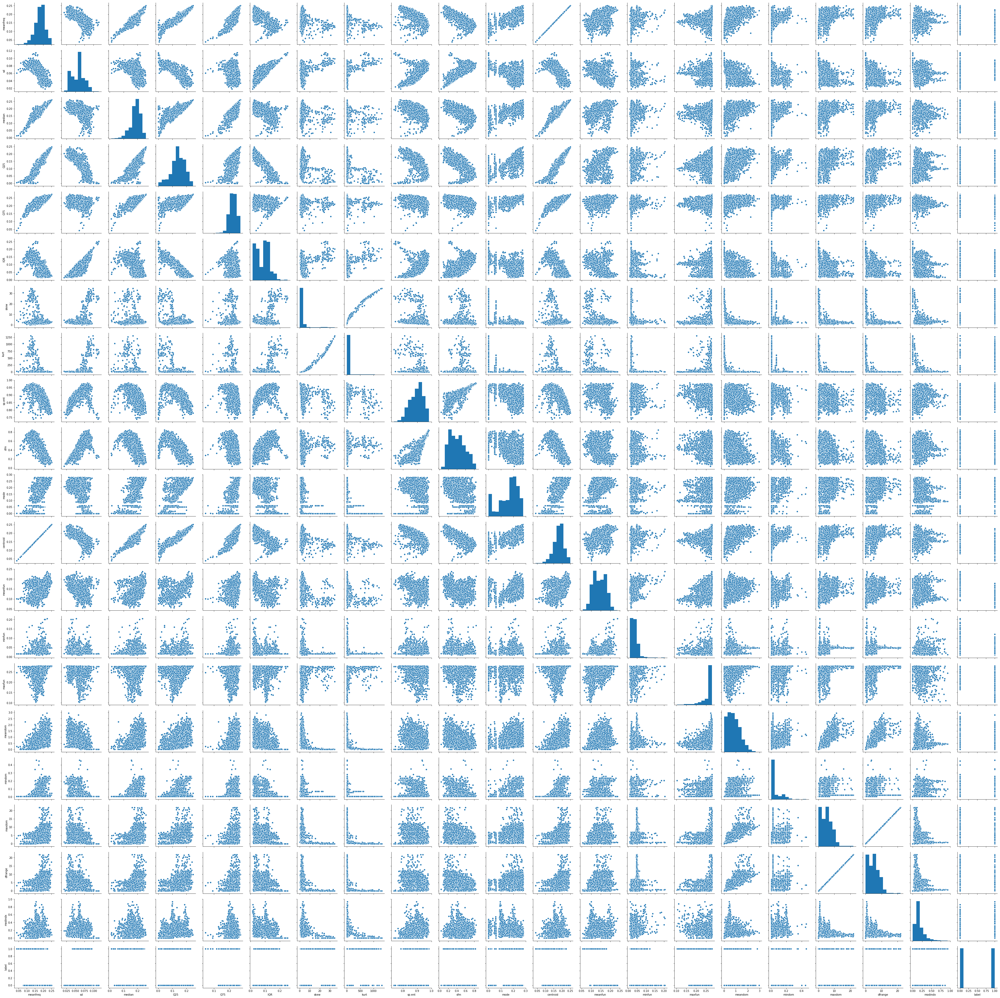

In [9]:
sns.pairplot(voice, vars = voice_raw.columns[0:])

不过观察最后一行或最后一列的图表，并不能得到什么明显的信息，所以我们还要用下面的方法主动得到相关性。

In [10]:
# 矢量图
%config InlineBackend.figure_format = 'pdf'

cov = np.corrcoef(voice.T)
img = plt.matshow(cov,cmap=plt.cm.winter)
plt.colorbar(img, ticks=[-1,0,1])
# 为了使代码清晰去掉xticks
# plt.xticks(np.arange(len(voice.keys())), voice.keys())
plt.yticks(np.arange(len(voice.keys())), voice.keys())
plt.show()

<Figure size 288x288 with 2 Axes>

### 重要特征的数据可视化

In [11]:
import matplotlib.pyplot as plt

# print voice['label']
# dataframe格式
voice_index = voice.index

# print voice_index

for i in range(3168):
    if voice['label'][voice_index[i]] == 1:
        plt.scatter(voice['meanfun'][voice_index[i]], voice['IQR'][voice_index[i]], c = 'blue', marker='.', alpha = 0.5, label = 'male')
    else:
        plt.scatter(voice['meanfun'][voice_index[i]], voice['IQR'][voice_index[i]], c = 'green', marker='.',alpha = 0.5, label = 'female')
plt.xlabel('meanfun')
plt.ylabel('IQR')
plt.title('The Distribution of meanfun and IQR')

Text(0.5,1,'The Distribution of meanfun and IQR')

<Figure size 432x288 with 1 Axes>

可以观察到，这两个特征的确很好地划分了数据集，蓝色点为男性语音样本，绿色为女性样本，呈现出了明显的二分类现象。这进一步证实了问题的可解性。

### 是否进行标准化的思考（本来忘记了考虑这一点）


可以注意到，各个特征的数量级还是有一定的差距的，比如100倍的差距。


因此，我们需要对数据进行标准化，这样可以消除量纲对对目标的影响。经标准化处理后，不同量纲的特征会有相同的尺度（scale）。这样，在学习参数的时候，不同的特征对参数的影响程度才会一样，参数也会尽快收敛。

> 参考自[数据什么时候需要做中心化和标准化处理? - 知乎](https://www.zhihu.com/question/37069477)

In [12]:
# 标准化处理以免被某些特征值主导预测
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
ss.fit(features_raw)
features = ss.transform(features_raw)

gender = np.array(gender_onehot)

# 这样voice变为数组模式
voice = [features, gender]
# print voice

## 3、模型训练、表现及改进


这一部分的主要训练是常见的监督模型（如标题所述），训练的思路是参考了一个使用R语言分析数据集的例子。


下面列出我所使用的模型：


* 基准模型


* Logistic回归（分类）模型


* 随机梯度参数估计（SGD）模型


* K近邻（分类）模型


* 支持向量机（SVC）模型


* 分类和回归树模型（CART）


* 随机森林模型


* 多层感知分类模型


* XGBoost模型


* 融合模型（Vote型）


主要的评估参数是准确性（Accuracy）。


按照参考文献的指导，这些特征是声学经验上的重要特征。


> 思路参考自[Identifying the Gender of a Voice using Machine Learning](http://www.primaryobjects.com/2016/06/22/identifying-the-gender-of-a-voice-using-machine-learning/)


---

### 训练集、验证集和测试集划分


先将处理后的数据集划分为训练集，验证集和测试集。每次切分的比例都是5:1。

In [13]:
# 分割数据
from sklearn.model_selection import train_test_split as tts

# 将'features'和'voice'数据切分成训练集和测试集
X_train, X_test, y_train, y_test = tts(features, gender, test_size = 0.2, random_state = 0,
                                                    stratify = gender)

# 将'X_train'和'y_train'进一步切分为训练集和验证集
X_train, X_val, y_train, y_val = tts(X_train, y_train, test_size=0.2, random_state = 0,
                                                    stratify = y_train)

# 显示切分的结果
print "Training set has {} samples.".format(X_train.shape[0])
print "Validation set has {} samples.".format(X_val.shape[0])
print "Testing set has {} samples.".format(X_test.shape[0])

# print X_val

Training set has 2027 samples.
Validation set has 507 samples.
Testing set has 634 samples.


如上所示，训练集包含2027个样本，验证集包含507个样本，测试集包含634个样本。

### 单个模型训练及结果

In [14]:
# http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
# http://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC
from sklearn import svm 
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
# http://scikit-learn.org/dev/modules/generated/sklearn.neural_network.MLPClassifier.html
from sklearn.neural_network import MLPClassifier

# 导入该模块可以得到其它参数以更客观地评价模型
from sklearn.metrics import classification_report


n_male_in_X_val = 0
for i in range(len(y_val)):
    if y_val[i] == 1:
        n_male_in_X_val = n_male_in_X_val + 1
n_male_in_X_train = 0
for i in range(len(y_train)):
    if y_train[i] == 1:
        n_male_in_X_train = n_male_in_X_train + 1
print 'Accuracy of Baseline Model on Training Set:', float(n_male_in_X_train) / len(y_train)
print 'Accuracy of Baseline Model on Validation Set:', float(n_male_in_X_val) / len(y_val)
print '\n'

lr = LogisticRegression()
starttime = time()
lr.fit(X_train, y_train)
endtime = time()
lr_y_train_predict = lr.predict(X_train)
print 'Accuracy of LR Classifier on Training Set:', lr.score(X_train, y_train)
lr_y_val_predict = lr.predict(X_val)
print 'Accuracy of LR Classifier on Validation Set:', lr.score(X_val, y_val)
print 'The Time Used for LR Training:', endtime - starttime
print classification_report(y_val, lr_y_val_predict)
print '\n'


sgdc = SGDClassifier(random_state = 0)
starttime = time()
sgdc.fit(X_train, y_train)
endtime = time()
sgdc_y_train_predict = sgdc.predict(X_train)
print 'Accuracy of SGD Classifier on Training Set:', sgdc.score(X_train, y_train)
sgdc_y_val_predict = sgdc.predict(X_val)
print 'Accuracy of SGD Classifier on Validation Set:', sgdc.score(X_val, y_val)
print 'The Time Used for SGD Training:', endtime - starttime
print classification_report(y_val, sgdc_y_val_predict)
print '\n'


knc = KNeighborsClassifier(n_neighbors = 3)
starttime = time()
knc.fit(X_train,y_train)
endtime = time()
knc_y_train_predict = knc.predict(X_train)
print 'Accuracy of KNC Classifier on Training Set:', knc.score(X_train, y_train)
knc_y_val_predict = knc.predict(X_val)
print 'Accuracy of KNC Classifier on Validation Set:', knc.score(X_val, y_val)
print 'The Time Used for KNC Training:', endtime - starttime
print classification_report(y_val, knc_y_val_predict)
print '\n'


svc = svm.SVC(C = 1.0, kernel= 'rbf', probability = True, random_state = 0)
starttime = time()
svc.fit(X_train,y_train)
endtime = time()
svc_y_train_predict = svc.predict(X_train)
print 'Accuracy of SVC Classifier on Training Set:', svc.score(X_train, y_train)
svc_y_val_predict = lr.predict(X_val)
print 'Accuracy of SVC Classifier on Validation Set:', svc.score(X_val, y_val)
print 'The Time Used for SVC Training:', endtime - starttime
print classification_report(y_val, svc_y_val_predict)
print '\n'


cart = DecisionTreeClassifier(random_state = 0)
starttime = time()
cart.fit(X_train,y_train)
endtime = time()
cart_y_train_predict = cart.predict(X_train)
print 'Accuracy of CART Classifier on Training Set:', cart.score(X_train, y_train)
cart_y_val_predict = lr.predict(X_val)
print 'Accuracy of CART Classifier on Validation Set:', cart.score(X_val, y_val)
print 'The Time Used for CART Training:', endtime - starttime
print classification_report(y_val, cart_y_val_predict)
print '\n'


rf = RandomForestClassifier(random_state = 0)
starttime = time()
rf.fit(X_train,y_train)
endtime = time()
rf_y_train_predict = rf.predict(X_train)
print 'Accuracy of RF Classifier on Training Set:', rf.score(X_train, y_train)
rf_y_val_predict = lr.predict(X_val)
print 'Accuracy of RF Classifier on Validation Set:', rf.score(X_val, y_val)
print 'The Time Used for RF Training:', endtime - starttime
print classification_report(y_val, rf_y_val_predict)
print '\n'


nn = MLPClassifier(max_iter = 100000, random_state = 0)
starttime = time()
nn.fit(X_train,y_train)
endtime = time()
nn_y_train_predict = nn.predict(X_train)
print 'Accuracy of NN Classifier on Training Set:', nn.score(X_train, y_train)
nn_y_val_predict = nn.predict(X_val)
print 'Accuracy of NN Classifier on Validation Set:', nn.score(X_val, y_val)
print 'The Time Used for NN Training:', endtime - starttime
print classification_report(y_val, nn_y_val_predict)
print '\n'


xgb = XGBClassifier(random_state = 0)
starttime = time()
xgb.fit(X_train,y_train)
endtime = time()
xgb_y_train_predict = xgb.predict(X_train)
print 'Accuracy of XGB Classifier on Training Set:', xgb.score(X_train, y_train)
xgb_y_val_predict = xgb.predict(X_val)
print 'Accuracy of XGB Classifier on Validation Set:', xgb.score(X_val, y_val)
print 'The Time Used for XGB Training:', endtime - starttime
print classification_report(y_val, xgb_y_val_predict)


# print lr
# print sgdc
# print knc
# print svm
# print cart
# print rf
# print nn
# print xgb

Accuracy of Baseline Model on Training Set: 0.500246669956
Accuracy of Baseline Model on Validation Set: 0.499013806706


Accuracy of LR Classifier on Training Set: 0.974346324618
Accuracy of LR Classifier on Validation Set: 0.976331360947
The Time Used for LR Training: 0.0280001163483
             precision    recall  f1-score   support

          0       0.98      0.97      0.98       254
          1       0.97      0.98      0.98       253

avg / total       0.98      0.98      0.98       507



Accuracy of SGD Classifier on Training Set: 0.970399605328
Accuracy of SGD Classifier on Validation Set: 0.970414201183
The Time Used for SGD Training: 0.00200009346008
             precision    recall  f1-score   support

          0       0.98      0.96      0.97       254
          1       0.96      0.98      0.97       253

avg / total       0.97      0.97      0.97       507





D:\Anaconda3\envs\py2\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:84: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.stochastic_gradient.SGDClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


Accuracy of KNC Classifier on Training Set: 0.987173162309
Accuracy of KNC Classifier on Validation Set: 0.968441814596
The Time Used for KNC Training: 0.00300002098083
             precision    recall  f1-score   support

          0       0.98      0.96      0.97       254
          1       0.96      0.98      0.97       253

avg / total       0.97      0.97      0.97       507



Accuracy of SVC Classifier on Training Set: 0.985199802664
Accuracy of SVC Classifier on Validation Set: 0.98224852071
The Time Used for SVC Training: 0.197999954224
             precision    recall  f1-score   support

          0       0.98      0.97      0.98       254
          1       0.97      0.98      0.98       253

avg / total       0.98      0.98      0.98       507



Accuracy of CART Classifier on Training Set: 1.0
Accuracy of CART Classifier on Validation Set: 0.972386587771
The Time Used for CART Training: 0.0250000953674
             precision    recall  f1-score   support

          0      

以上结果对比Kaggle上的结果如下：（注意准确率的意义不同！）


| 模型 | Kaggle | Trained Here|
| :-: | :-: | :-: |
| Baseline | 50% / 50% | 50.0% / 49.9% |
| LR | 97% / 98% | 97.4% / 97.6% |
| SGD | Not Trained | 97.0% / 97.0% |
| KNC | Not Trained | 98.7% / 96.8% |
| SVM | 100% / 99% | 98.5% / 98.2% |
| CART | 96% / 97% | 100% / 97.2% |
| RF | 100% / 98% | 99.9% / 99.0% |
| NN | Not Trained | 98.7% / 97.2% |
| XGBoost | 100% / 99% | 99.7% / 98.6% |


> Kaggle上的结果为训练集/测试集，这里的结果为训练集/验证集。测试集在最后使用。

这里我要插上一个分析，有关我在开题报告和数据预处理中查找重要特征部分所做的假设，即借用sklearn中随机森林分类器的**feature_importances_**函数来得到特征重要性。下面就是重要性的可视化结果。


从此结果上看，meanfun特征和IQR特征也是最重要的两个特征，分别占比34%和18%，总和超过了50%，这进一步验证了之前有关特征重要性的判断。

In [15]:
# 利用有'feature_importances_'函数的监督学习模型，这里用的是随机森林的库
# 提取特征重要性并绘图表示，函数来自visuals.py
vs.feature_plot(rf.feature_importances_, X_train, y_train, voice_features_names)

<Figure size 648x360 with 1 Axes>

In [16]:
from xgboost import plot_importance
plot_importance(xgb)

<Figure size 432x288 with 1 Axes>

### 多个模型融合（Vote型）

这里我只使用了最简单的投票型融合模型。其原理是使用多个训练好的分类器，对每一次测试，它们各自都进行一次预测，预测结果最多的一个当选为最终结果。这样做的优点很显然，可以避免某一个模型的偶然错误，各方投票决定的结果往往准确性更高。


我的思路是根据上述训练结果在验证集上的表现选出最优的5个分类器，分别是支持向量机模型、分类和回归树模型、随机森林模型、多层感知分类模型和XGBoost模型（排名未分先后）。下面得到投票函数记为*best_pre*，我们仍用验证集进行测试。


> 参考自[Kaggle Ensembling Guide | MLWave](https://mlwave.com/kaggle-ensembling-guide/)和[Ensemble Learning-模型融合-Python实现 CSDN博客](https://blog.csdn.net/shine19930820/article/details/75209021)

In [17]:
# 构建分类器集合
clf = [svc, cart, rf, nn, xgb]

# 定义投票函数
def best_pre(clf, xtest):
    
    # ri用来记录单个分类器的预测结果，为list类型
    r1 = svc.predict(xtest)
    r2 = cart.predict(xtest)
    r3 = rf.predict(xtest)
    r4 = nn.predict(xtest)
    r5 = xgb.predict(xtest)
    l = len(xtest)
    r = np.zeros(l)
    
    # 投票过程，权重设置为一样，均为20%
    for i in range(l):
        re = 0
        if r1[i] == 1:
            re = re + 0.20
        if r2[i] == 1:
            re = re + 0.20
        if r3[i] == 1:
            re = re + 0.20
        if r4[i] == 1:
            re = re + 0.20
        if r5[i] == 1:
            re = re + 0.20
        if re > 0.5:
            r[i] = 1
        else:
            r[i] = 0
    return r

# 依次验证投票分类器在训练集和验证集上的结果
print 'The Accuracy score on Training Set is:', (best_pre(clf,X_train) == y_train).tolist().count(True) / float(len(y_train))
print 'The Accuracy score on Validation Set is:', (best_pre(clf,X_val) == y_val).tolist().count(True) / float(len(y_val))

The Accuracy score on Training Set is: 0.996546620622
The Accuracy score on Validation Set is: 0.986193293886


如上所示，新的融合模型在训练集上的表现仍然很好，准确性为99.7%，在验证集上的表现仅次于随机森林，与XGBoost持平，准确性为98.6%。


但是这似乎还不够，我们仍然有其它方法可以得到更好的结果。我将提出两种方法并实现其中较简单的一种。

### 优化单个模型进而优化融合模型


正如上一部分所说，我们还有改进的方法，其一是使用更强的融合模型，由于时间限制，我不打算实现这一部分，只把方法留在这里。


另一种就是我要实现的，通过改进单个预测器来改进融合模型。改进的方法是网格搜索和交叉验证法，希望找到单个模型的更佳参数。

这里各个模型优化的参数不一一赘述，我将在报告中再提一次。

In [18]:
# 导入网格搜索所需：http://scikit-learn.org/stable/modules/generated/sklearn.grid_search.GridSearchCV.html
from sklearn.model_selection import GridSearchCV, KFold


# 找到最优的cart模型
# 创建一个交叉验证生成器对象
cross_validator = KFold()

# http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html
cart_cv = DecisionTreeClassifier(random_state = 0)

# 为待优化参数创建字典
parameters = {'criterion': ('gini', 'entropy'), 'splitter': ('best', 'random'), 'max_depth': range(1,11)}

# 创建网格搜索对象
grid = GridSearchCV(estimator = cart_cv, param_grid = parameters, scoring = 'accuracy', cv = cross_validator)

# 网格搜索
starttime = time()
grid = grid.fit(X_train, y_train)
endtime = time()

cart_best = grid.best_estimator_

# 返回网格搜索后的最优模型
# return grid.best_estimator_
    
print ("CART's best parameters:"), grid.best_params_
print ("CART's best score:"), grid.best_score_
print 'The Time Used for CART CV:', endtime - starttime

CART's best parameters: {'splitter': 'best', 'criterion': 'gini', 'max_depth': 3}
CART's best score: 0.965466206216
The Time Used for CART CV: 1.04200005531


In [19]:
# 找到最优的SVM模型
# 创建一个交叉验证生成器对象
cross_validator = KFold()

# http://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
svc_cv = svm.SVC(C = 1.0, kernel= 'rbf', probability = True, random_state = 0)

# 为待优化参数创建字典
parameters = {'C': np.arange(0.1, 1.0, 0.1), 'kernel': ('linear', 'poly', 'rbf', 'sigmoid'),
              'gamma': np.arange(0, 1.0, 0.1)}

# 创建网格搜索对象
grid = GridSearchCV(estimator = svc_cv, param_grid = parameters, scoring = 'accuracy', cv = cross_validator)

# 网格搜索
starttime = time()
grid = grid.fit(X_train, y_train)
endtime = time()

svc_best = grid.best_estimator_
    
print ("SVC's best parameters:"), grid.best_params_
print ("SVC's best score:"), grid.best_score_
print 'The Time Used for SVC CV:', endtime - starttime

SVC's best parameters: {'kernel': 'rbf', 'C': 0.80000000000000004, 'gamma': 0.10000000000000001}
SVC's best score: 0.981253083374
The Time Used for SVC CV: 242.392999887


In [20]:
# 找到最优的rf模型
# 创建一个交叉验证生成器对象
cross_validator = KFold()

# http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
rf_cv = RandomForestClassifier(random_state = 0)

# 为待优化参数创建字典
parameters = {'n_estimators': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], 'criterion': ('gini', 'entropy'),
              'max_depth': range(1,11)}

# 创建网格搜索对象
grid = GridSearchCV(estimator = rf_cv, param_grid = parameters, scoring = 'accuracy', cv = cross_validator)

# 网格搜索
starttime = time()
grid = grid.fit(X_train, y_train)
endtime = time()

rf_best = grid.best_estimator_
    
print ("RF's best parameters:"), grid.best_params_
print ("RF's best score:"), grid.best_score_
print 'The Time Used for RF CV:', endtime - starttime

RF's best parameters: {'n_estimators': 12, 'criterion': 'gini', 'max_depth': 7}
RF's best score: 0.976813024174
The Time Used for RF CV: 47.8340001106


In [21]:
# 找到最优的nn模型
# 创建一个交叉验证生成器对象
cross_validator = KFold()

# http://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html
nn_cv = MLPClassifier(max_iter = 100000, random_state = 0)

# 为待优化参数创建字典
parameters = {'activation': ('identity', 'logistic', 'tanh', 'relu'), 'solver': ('lbfgs', 'sgd', 'adam'),
              'batch_size': ('auto', 200, 500, 1000), 'alpha': [0.0001, 0.0002, 0.0003, 0.0004, 0.0005]}

# 创建网格搜索对象
grid = GridSearchCV(estimator = nn_cv, param_grid = parameters, scoring = 'accuracy', cv = cross_validator)

# 网格搜索
starttime = time()
grid = grid.fit(X_train, y_train)
endtime = time()

nn_best = grid.best_estimator_
    
print ("NN's best parameters:"), grid.best_params_
print ("NN's best score:"), grid.best_score_
print 'The Time Used for NN CV:', endtime - starttime

NN's best parameters: {'alpha': 0.0003, 'activation': 'relu', 'batch_size': 1000, 'solver': 'adam'}
NN's best score: 0.977799703996
The Time Used for NN CV: 1114.97600007


In [22]:
# 找到最优的xgb模型
# 创建一个交叉验证生成器对象
cross_validator = KFold()

# https://xgboost.readthedocs.io/en/latest/python/python_api.html?highlight=XGBClassifier
xgb_cv = XGBClassifier(random_state = 0)

# 为待优化参数创建字典
parameters = {'n_estimators': [100, 200], 'max_depth': [3, 4, 5, 6, 7, 8, 9 , 10], 'learning_rate': np.arange(0.1, 0.5, 0.1),
              'booster': ('gbtree', 'gblinear', 'dart')}

# 创建网格搜索对象
grid = GridSearchCV(estimator = xgb_cv, param_grid = parameters, scoring = 'accuracy', cv = cross_validator)

# 网格搜索
starttime = time()
grid = grid.fit(X_train, y_train)
endtime = time()

xgb_best = grid.best_estimator_
    
print ("XGB's best parameters:"), grid.best_params_
print ("XGB's best score:"), grid.best_score_
print 'The Time Used for XGB CV:', endtime - starttime

XGB's best parameters: {'n_estimators': 200, 'learning_rate': 0.20000000000000001, 'max_depth': 3, 'booster': 'gbtree'}
XGB's best score: 0.977799703996
The Time Used for XGB CV: 181.176000118


In [23]:
# 构建分类器集合
clfs = [svc_best, cart_best, rf_best, nn_best, xgb_best]

# 定义投票函数
def best(clfs, xtest):
    # ri用来记录单个分类器的预测结果，为list类型
    r1 = svc_best.predict(xtest)
    r2 = cart_best.predict(xtest)
    r3 = rf_best.predict(xtest)
    r4 = nn_best.predict(xtest)
    r5 = xgb_best.predict(xtest)
    l = len(xtest)
    r = np.zeros(l)
    # 投票过程，权重设置为一样，均为20%
    for i in range(l):
        re = 0
        if r1[i] == 1:
            re = re + 0.20
        if r2[i] == 1:
            re = re + 0.20
        if r3[i] == 1:
            re = re + 0.20
        if r4[i] == 1:
            re = re + 0.20
        if r5[i] == 1:
            re = re + 0.20
        if re > 0.5:
            r[i] = 1
        else:
            r[i] = 0
    return r

# 依次验证投票分类器在训练集和验证集上的结果
print 'The Accuracy score on Training Set is:', (best(clfs,X_train) == y_train).tolist().count(True) / float(len(y_train))
print 'The Accuracy score on Validation Set is:', (best(clfs,X_val) == y_val).tolist().count(True) / float(len(y_val))

The Accuracy score on Training Set is: 0.991119881598
The Accuracy score on Validation Set is: 0.978303747535


### 对优化的思考及最终测试

可以看到经过初步优化，效果似乎不是很好，但事实上模型的性能已经提升了，我们还需要在测试集上进行最终测试以验证结果。

In [24]:
print 'The Accuracy score of lr on Test Set is:', lr.score(X_test, y_test)

print 'The Accuracy score of sgdc on Test Set is:', sgdc.score(X_test, y_test)

print 'The Accuracy score of knc on Test Set is:', knc.score(X_test, y_test)

print 'The Accuracy score of svc on Test Set is:', svc.score(X_test, y_test)

print 'The Accuracy score of cart on Test Set is:', cart.score(X_test, y_test)

print 'The Accuracy score of rf on Test Set is:', rf.score(X_test, y_test)

print 'The Accuracy score of nn on Test Set is:', nn.score(X_test, y_test)

print 'The Accuracy score of xgb on Test Set is:', xgb.score(X_test, y_test)

print 'The Accuracy score of voted clfs on Test Set is:', (best_pre(clf,X_test) == y_test).tolist().count(True) / float(len(y_test))

print 'The Accuracy score of CVed voted clfs on Test Set is:', (best(clfs,X_test) == y_test).tolist().count(True) / float(len(y_test))

The Accuracy score of lr on Test Set is: 0.971608832808
The Accuracy score of sgdc on Test Set is: 0.960567823344
The Accuracy score of knc on Test Set is: 0.979495268139
The Accuracy score of svc on Test Set is: 0.977917981073
The Accuracy score of cart on Test Set is: 0.971608832808
The Accuracy score of rf on Test Set is: 0.970031545741
The Accuracy score of nn on Test Set is: 0.979495268139
The Accuracy score of xgb on Test Set is: 0.971608832808
The Accuracy score of voted clfs on Test Set is: 0.976340694006
The Accuracy score of CVed voted clfs on Test Set is: 0.976340694006


从以上结果来看，运用交叉验证以及网格搜索后，模型在验证集上的评分并没有改变，这是为什么呢？


据我分析，输出新的分类器可以知道交叉验证的确调整了预测器的参数，模型的确是做了一些优化，但是我们的验证集的规模比较小，预测失败的数据可能是比较顽固的数据，即可能处在男女声音的边界处，因此即使模型的性能有所提升，它在验证集上的表现也不一定好。


根据分析，这就是上述5个模型利用投票机制融合得到的最优模型。它在测试集上的准确率为97.6%。我想，如果测试集中处于边界处的点较少的话是可以得到更高的准确率的。

### 对于预测失败点的讨论

In [25]:
X_test_list = X_test.tolist()
y_test_list = y_test.tolist()
pre = best(clfs,X_test_list)
for i in range(len(X_test_list)):
    if y_test_list[i] != pre[i]:
        plt.scatter(X_test_list[i][12], X_test_list[i][5], c = 'blue', marker='.', alpha = 0.5, label = 'wrong')
    else:
        plt.scatter(X_test_list[i][12], X_test_list[i][5], c = 'green', marker='.',alpha = 0.5, label = 'right')
plt.xlabel('meanfun')
plt.ylabel('IQR')
plt.title('Mistaken Points')

Text(0.5,1,'Mistaken Points')

<Figure size 432x288 with 1 Axes>

如上所示，可以看到少量蓝色的数据点是预测失败的点。


它们普遍分布在男性、女性样本点集合的交界处，预测失败也是可以理解的。毕竟现实生活中很多男女的声音也是难以分辨的，因此总的来说我们的模型的结果已经很好了。

## 4、结论

通过以上的模型训练，可以确认的是该项目的基本任务已经完成。最终得到的预测器在测试集上达到了97.6%的准确性。这与Kaggle上的最优结果相比还有差距，但这已经达到了较好的预测表现。鉴于这里测试集较小，我认为该模型的性能在实际应用上会更强。


后续还可以对模型再做优化，譬如增大数据样本总量，这样训练得到的模型会得到更强的泛化结果。